# Twitter Analysis

In [42]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from textblob import TextBlob
from bs4 import BeautifulSoup
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
%matplotlib inline

In [43]:
# Setup & Cleaning

file = "data/twitter.xlsx"
df = pd.read_excel(file)

def clean_emojis(text):
    return re.sub("[<].*[>]", " ", text)

def clean_tweet(tweet):
    return ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)|RT", " ", tweet).split()) 

df["text"] = df["text"].apply(clean_emojis)
df["text"] = df["text"].apply(clean_tweet)


df.head()

,S.no,text,favorited,favoriteCount,replyToSN,created,truncated,replyToSID,id,replyToUID,statusSource,screenName,retweetCount,isRetweet,retweeted
0,1,Critical question Was PayTM informed about Dem...,False,0,NaN,2016-11-23 18:40:00,False,NaN,801496000000000000,NaN,"<a href=""http://twitter.com/download/android"" ...",HASHTAGFARZIWAL,331,True,False
1,2,80 Did you vote on Demonetization on Modi surv...,False,0,NaN,2016-11-23 18:40:00,False,NaN,801496000000000000,NaN,"<a href=""http://twitter.com/download/android"" ...",PRAMODKAUSHIK9,66,True,False
2,3,Former FinSec RBI Dy Governor CBDT Chair Harva...,False,0,NaN,2016-11-23 18:40:00,False,NaN,801496000000000000,NaN,"<a href=""http://twitter.com/download/android"" ...",rahulja13034944,12,True,False
3,4,news Gurugram Haryana Post office employees pr...,False,0,NaN,2016-11-23 18:39:00,False,NaN,801496000000000000,NaN,"<a href=""http://twitter.com/download/android"" ...",deeptiyvd,338,True,False
4,5,Reddy Wedding today cartoon demonetization Red...,False,0,NaN,2016-11-23 18:39:00,False,NaN,801495000000000000,NaN,"<a href=""http://cpimharyana.com"" rel=""nofollow...",CPIMBadli,120,True,False


In [44]:
# Sentiment Analysis and Structuring the Data

def get_polarity(text):
    analysis = TextBlob(text)
    return analysis.sentiment.polarity

df["polarity"] = df.text.apply(get_polarity)

text_data_df = df
text_data_df = text_data_df.drop("favorited", 1)
text_data_df = text_data_df.drop("created", 1)
text_data_df = text_data_df.drop("truncated", 1)
text_data_df = text_data_df.drop("replyToSID", 1)
text_data_df = text_data_df.drop("statusSource", 1)

text_data_df.head()

,S.no,text,favoriteCount,replyToSN,id,replyToUID,screenName,retweetCount,isRetweet,retweeted,polarity
0,1,Critical question Was PayTM informed about Dem...,0,NaN,801496000000000000,NaN,HASHTAGFARZIWAL,331,True,False,0.15
1,2,80 Did you vote on Demonetization on Modi surv...,0,NaN,801496000000000000,NaN,PRAMODKAUSHIK9,66,True,False,0.00
2,3,Former FinSec RBI Dy Governor CBDT Chair Harva...,0,NaN,801496000000000000,NaN,rahulja13034944,12,True,False,0.00
3,4,news Gurugram Haryana Post office employees pr...,0,NaN,801496000000000000,NaN,deeptiyvd,338,True,False,0.00
4,5,Reddy Wedding today cartoon demonetization Red...,0,NaN,801495000000000000,NaN,CPIMBadli,120,True,False,0.00


In [45]:
# exporting analysed & structured data to an excel sheet
# text_data_df.to_excel(r'Twitter_Structured_Data.xlsx')

In [46]:
# Seperating the tweets on the basis of Sentiment/Polarity

df_positive = text_data_df.loc[text_data_df["polarity"] > 0]
df_negative = text_data_df.loc[text_data_df["polarity"] < 0]
df_neutral = text_data_df.loc[text_data_df["polarity"] == 0]

In [47]:
print("\n\nPOSITIVE:\n")
df_positive.info()



POSITIVE:

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2648 entries, 0 to 7998
Data columns (total 11 columns):
S.no             2648 non-null int64
text             2648 non-null object
favoriteCount    2648 non-null int64
replyToSN        104 non-null object
id               2648 non-null int64
replyToUID       104 non-null float64
screenName       2648 non-null object
retweetCount     2648 non-null int64
isRetweet        2648 non-null bool
retweeted        2648 non-null bool
polarity         2648 non-null float64
dtypes: bool(2), float64(2), int64(4), object(3)
memory usage: 212.0+ KB


In [48]:
print("\n\nNEGATIVE:\n")
df_negative.info()



NEGATIVE:

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1243 entries, 14 to 7999
Data columns (total 11 columns):
S.no             1243 non-null int64
text             1243 non-null object
favoriteCount    1243 non-null int64
replyToSN        80 non-null object
id               1243 non-null int64
replyToUID       80 non-null float64
screenName       1243 non-null object
retweetCount     1243 non-null int64
isRetweet        1243 non-null bool
retweeted        1243 non-null bool
polarity         1243 non-null float64
dtypes: bool(2), float64(2), int64(4), object(3)
memory usage: 99.5+ KB


In [49]:
print("\n\nNEUTRAL:\n")
df_neutral.info()



NEUTRAL:

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4109 entries, 1 to 7996
Data columns (total 11 columns):
S.no             4109 non-null int64
text             4109 non-null object
favoriteCount    4109 non-null int64
replyToSN        132 non-null object
id               4109 non-null int64
replyToUID       132 non-null float64
screenName       4109 non-null object
retweetCount     4109 non-null int64
isRetweet        4109 non-null bool
retweeted        4109 non-null bool
polarity         4109 non-null float64
dtypes: bool(2), float64(2), int64(4), object(3)
memory usage: 329.0+ KB


COMPLETE:


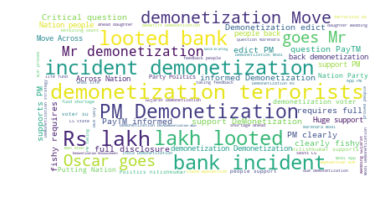

In [50]:
all_text = " ".join(t for t in text_data_df.text)
print("COMPLETE:")
stopwords = set(STOPWORDS)
stopwords.update(["amp", "RT", "Kishtwar", "Third"])
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(all_text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

POSITIVE:


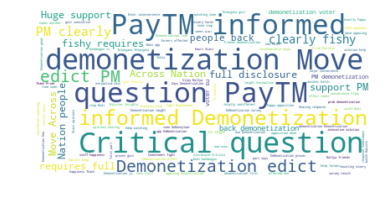

In [51]:
positive_text = " ".join(t for t in df_positive.text)
print("POSITIVE:")
stopwords = set(STOPWORDS)
stopwords.update(["amp", "RT", "Kishtwar", "Third"])
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(positive_text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

NEGATIVE:


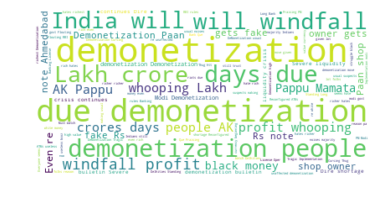

In [52]:
negative_text = " ".join(t for t in df_negative.text)
print("NEGATIVE:")
stopwords = set(STOPWORDS)
stopwords.update(["amp", "RT", "Kishtwar", "Third"])
wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(negative_text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

User wise tweets:


<IPython.core.display.Javascript object>


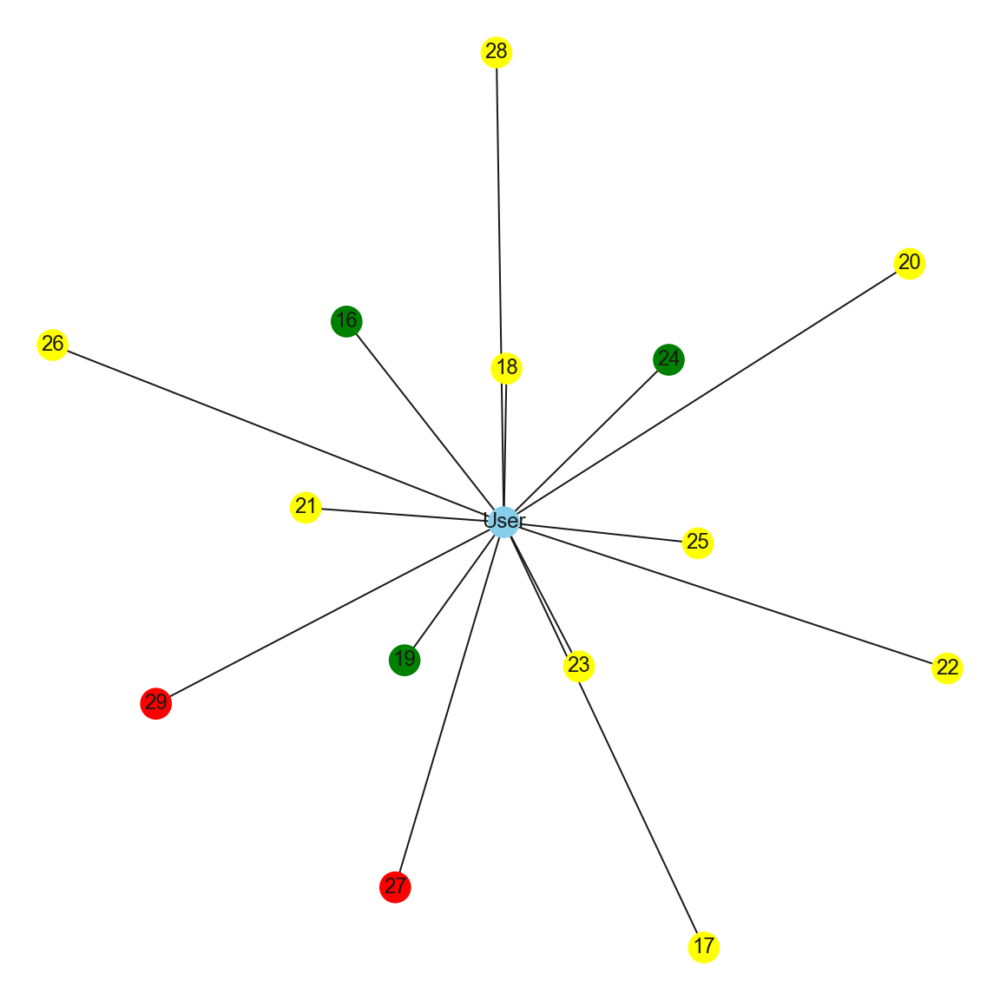

/Users/sarthakdandotiya/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


<IPython.core.display.Javascript object>


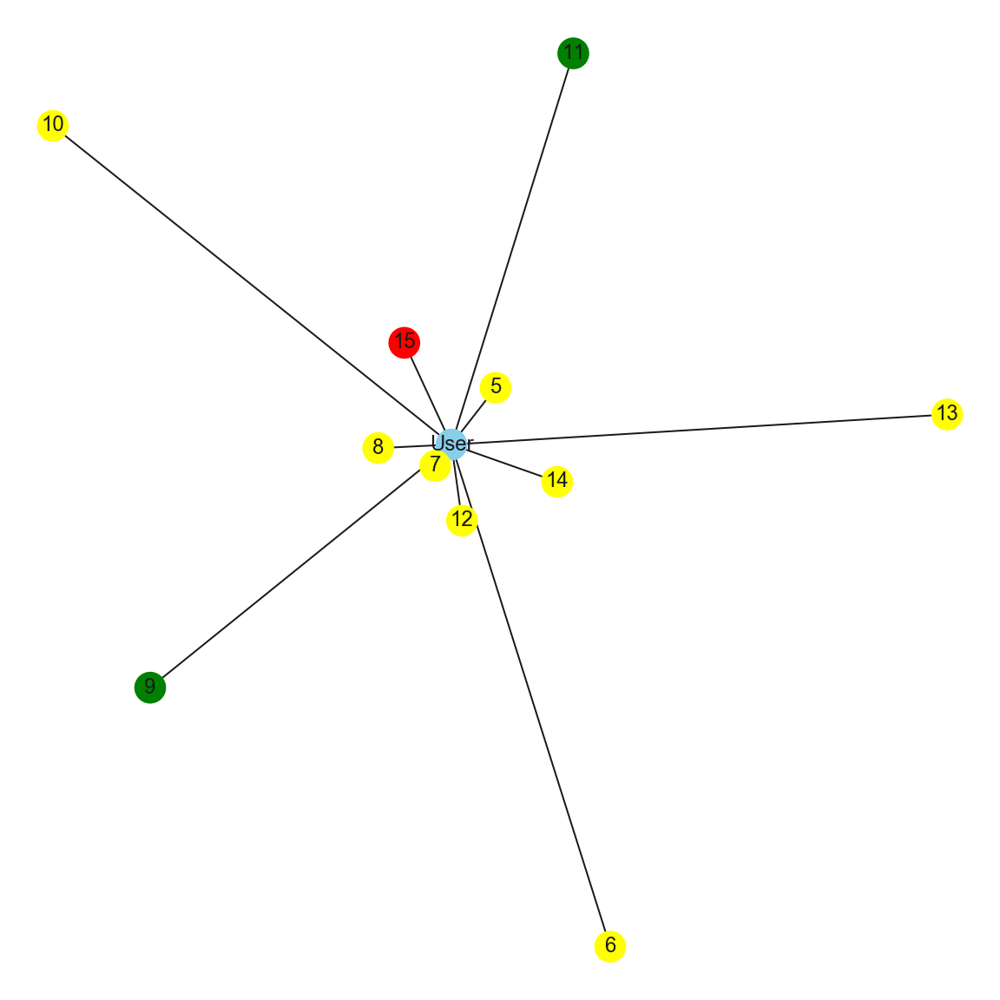

/Users/sarthakdandotiya/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


<IPython.core.display.Javascript object>


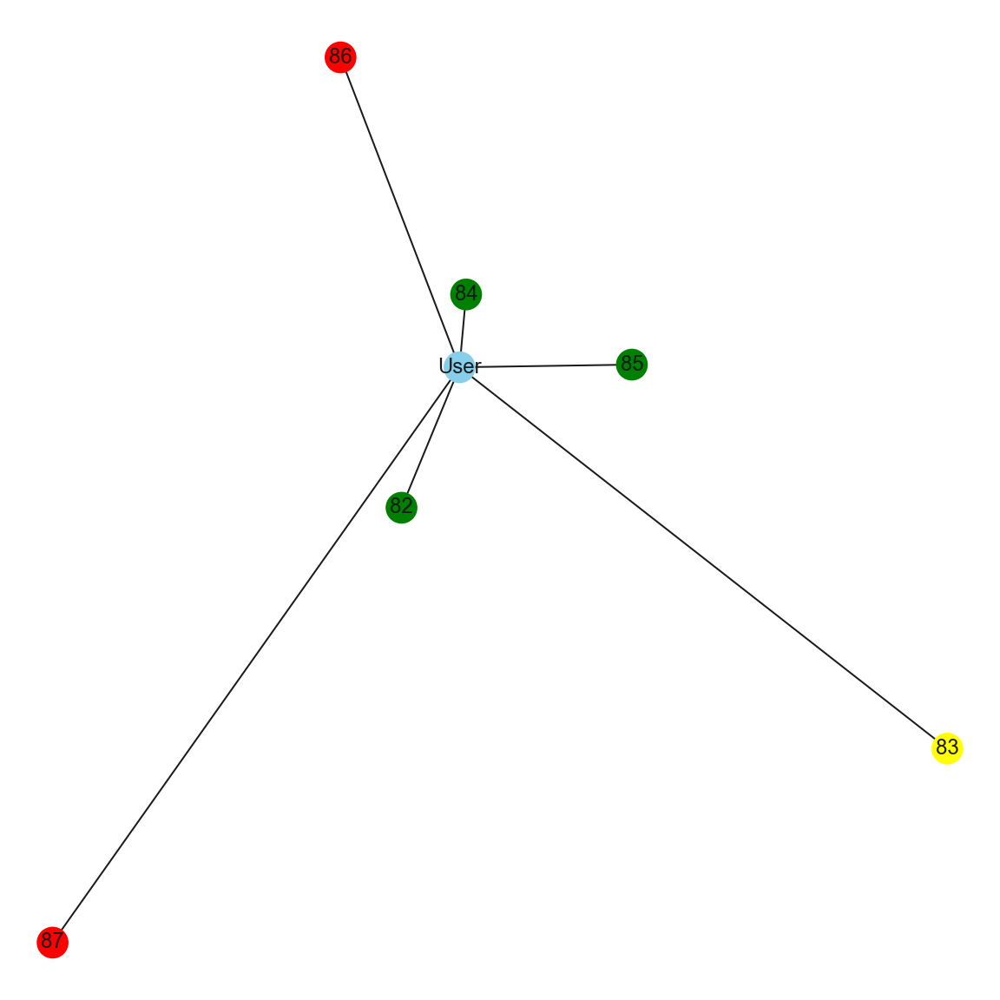

/Users/sarthakdandotiya/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


In [53]:
import networkx as nx
import seaborn as sns
%matplotlib notebook
sns.set()

# User Tweets Graph along with sentiment

def user_graph(uid):
    user_df = text_data_df.loc[text_data_df["id"] == uid]
    G = nx.Graph()
    
    G.add_node("User") # User
    color_map = ["skyblue"]
    
    for i, r in user_df.iterrows():
        if(user_df.polarity[i] > 0):
            color_map.append('green')
        elif(user_df.polarity[i] < 0):
            color_map.append('red')
        elif(user_df.polarity[i] == 0):
            color_map.append('yellow')
        G.add_node(i+1)
        G.add_edge("User",i+1, weight=1+user_df["retweetCount"][i])
        
    plt.figure(figsize=(8,8))
    pos = nx.spring_layout(G)
    lengths = nx.get_edge_attributes(G, "weight")
    nx.draw(G, node_color = color_map, with_labels = True)
    plt.show()

print("User wise tweets:")
    
user_graph(801494000000000000)
user_graph(801495000000000000)
user_graph(801489000000000000)

Processed


<IPython.core.display.Javascript object>


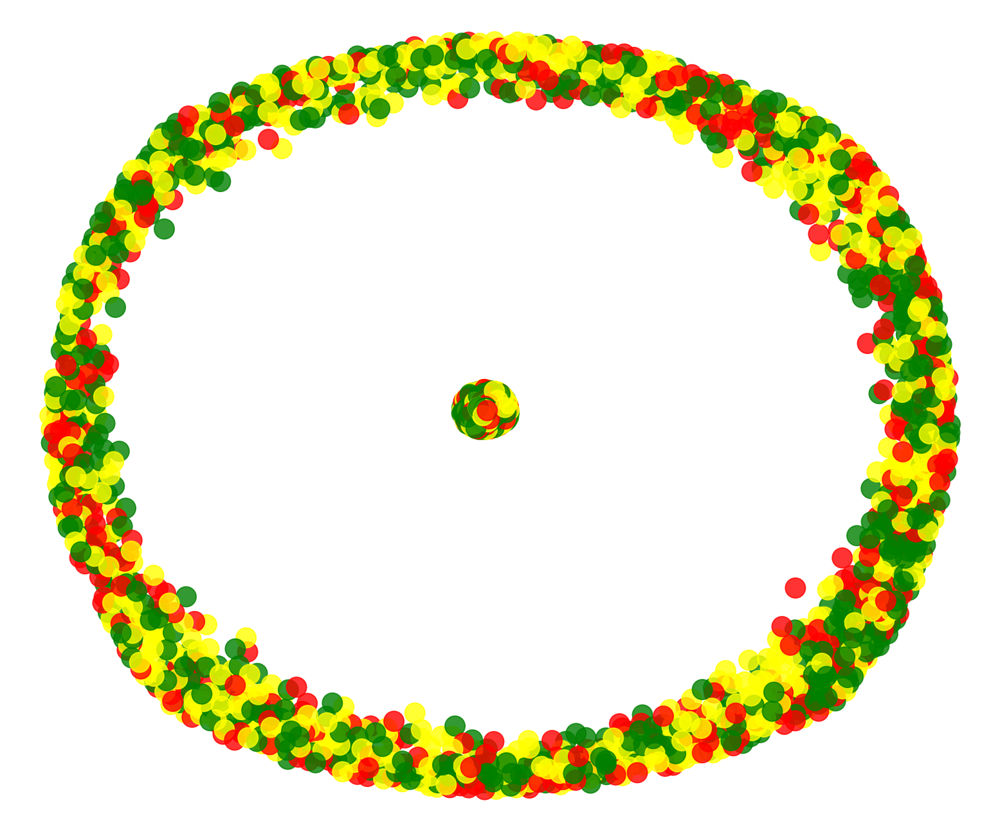

CPU times: user 6min 43s, sys: 2.91 s, total: 6min 46s
Wall time: 6min 37s


/Users/sarthakdandotiya/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


In [15]:
%%time
def retweet_graph(df):
    G = nx.Graph()
    
    G.add_node("IsRetweet")
    G.add_node("Retweeted")
    color_map = ["blue", "magenta"]
#     G.add_edge("IsRetweet", "Retweeted")
    
    for i, r in df.iterrows():
        if(df.polarity[i] > 0):
            color_map.append('green')
        elif(df.polarity[i] < 0):
            color_map.append('red')
        elif(df.polarity[i] == 0):
            color_map.append('yellow')
        G.add_node(i+1)
        if r.isRetweet:
            G.add_edge("IsRetweet",i+1, weight= 1 + r.retweetCount)
        if r.retweeted:
            G.add_edge("Retweeted",i+1, weight= 1 + r.retweetCount)
        if(i == 7900):
            print("Processed")
    
    plt.figure("Retweeted or Retweet or Neither?", figsize=(12,10))
    pos = nx.spring_layout(G)
    lengths = nx.get_edge_attributes(G, "weight")
    nx.draw(G, node_color = color_map, alpha=0.8)
    plt.show()

retweet_graph(text_data_df)

Processed


<IPython.core.display.Javascript object>


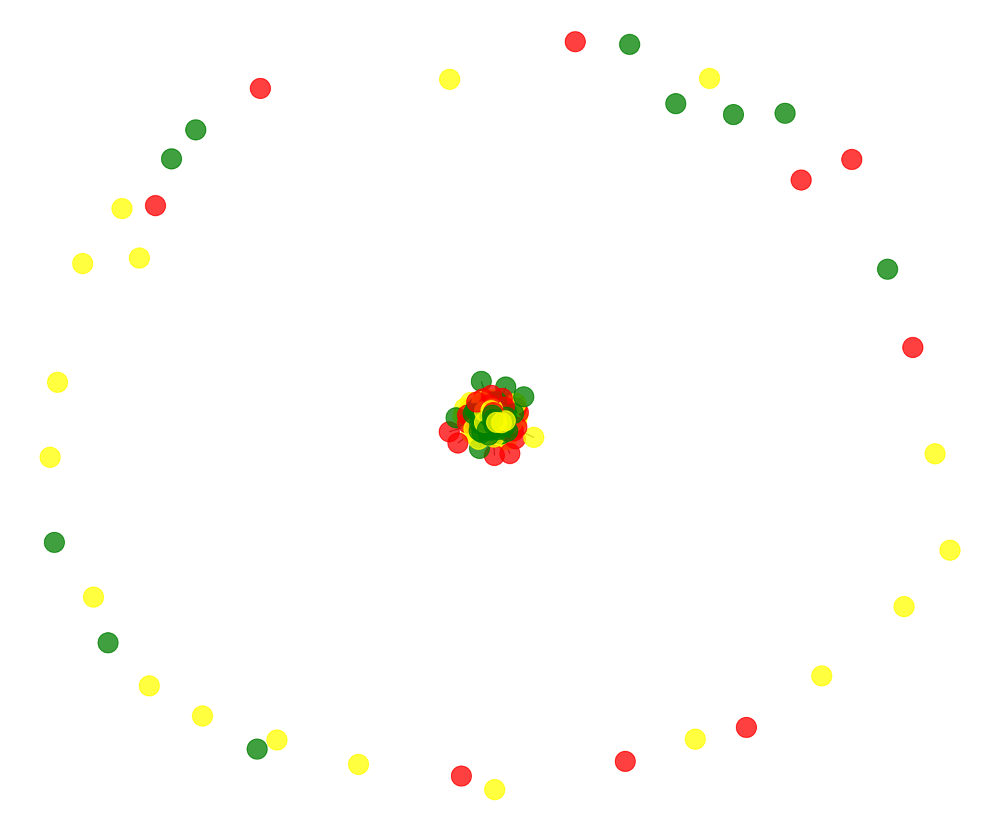

/Users/sarthakdandotiya/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


<IPython.core.display.Javascript object>


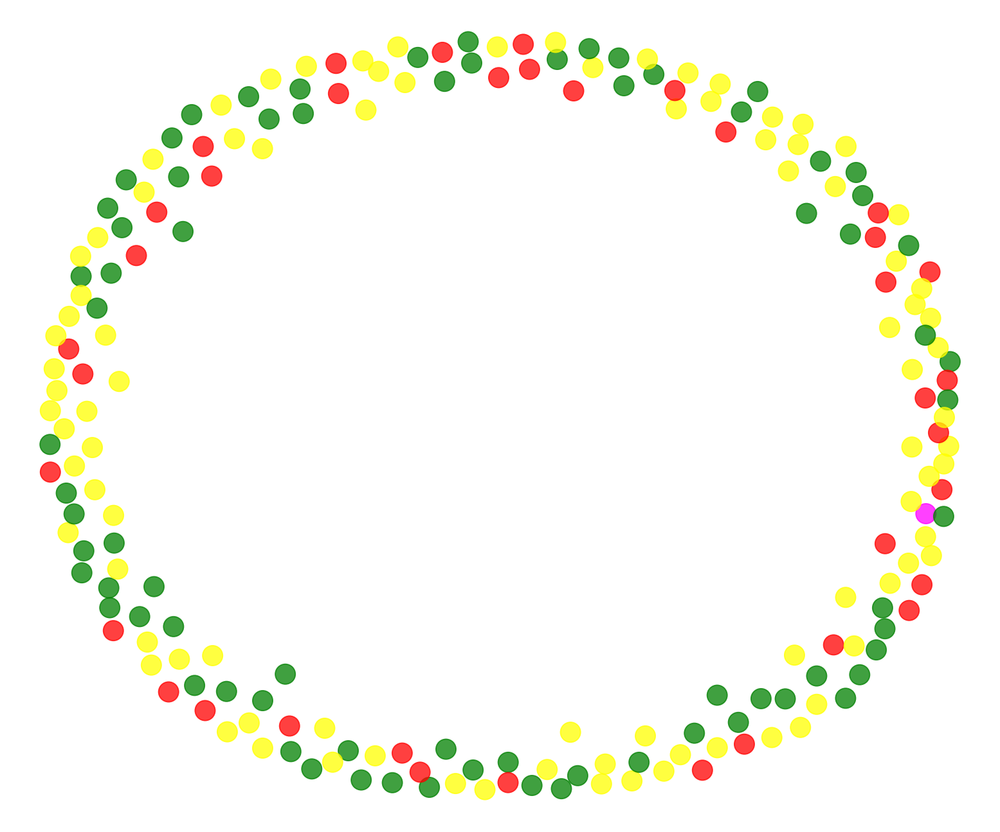

CPU times: user 658 ms, sys: 16.8 ms, total: 675 ms
Wall time: 726 ms


In [16]:
%%time
def retweet_graph(df):
    G1 = nx.Graph()
    G2 = nx.Graph()
    
    G1.add_node(0)
    G2.add_node(0)
    color_map = ["magenta"]
    
    for i, r in df.iterrows():
        if(df.polarity[i] > 0):
            color_map.append('green')
        elif(df.polarity[i] < 0):
            color_map.append('red')
        elif(df.polarity[i] == 0):
            color_map.append('yellow')
        G1.add_node(i+1)
        G2.add_node(i+1)
        if df["isRetweet"][i] == True:
            G1.add_edge(0,i+1, weight= 1 + df["retweetCount"][i])
        if df["retweeted"][i] == True:
            G2.add_edge(0,i+1, weight= 1 + df["retwweted"][i])
        if(i == 200):
            print("Processed")
            break
    
    plt.figure("isRetweet", figsize=(12,10))
    pos = nx.spring_layout(G1)
    lengths = nx.get_edge_attributes(G1, "weight")
    nx.draw(G1, node_color = color_map, alpha=0.75, with_labels=False)
    plt.show()
    
    plt.figure("retweeted", figsize=(12,10))
    pos = nx.spring_layout(G2)
    lengths = nx.get_edge_attributes(G2, "weight")
    nx.draw(G2, node_color = color_map, alpha=0.75, with_labels=False)
    plt.show()

retweet_graph(text_data_df)

# Facebook Analysis

In [4]:
import networkx as nx
import seaborn as sns
%matplotlib notebook
sns.set()

In [5]:
df_fb = pd.read_csv('data/facebook.tsv', sep='\t')
df_fb.head()

,userid,age,dob_day,dob_year,dob_month,gender,tenure,friend_count,friendships_initiated,likes,likes_received,mobile_likes,mobile_likes_received,www_likes,www_likes_received
0,2094382,14,19,1999,11,male,266.0,0,0,0,0,0,0,0,0
1,1192601,14,2,1999,11,female,6.0,0,0,0,0,0,0,0,0
2,2083884,14,16,1999,11,male,13.0,0,0,0,0,0,0,0,0
3,1203168,14,25,1999,12,female,93.0,0,0,0,0,0,0,0,0
4,1733186,14,4,1999,12,male,82.0,0,0,0,0,0,0,0,0


In [30]:
fb_adolescent = df_fb.loc[(df_fb.age <= 20)]
# fb_adolescent.dropna()
fb_adult = df_fb.loc[(df_fb.age <= 59) & (df_fb.age >= 19)]
# fb_adult.dropna()
fb_senior = df_fb.loc[(df_fb.age >= 60)]
# fb_adult.dropna()

def age_df(df, age):
    return df.loc[(df_fb.age == age)]

Lifestage User Disribution


<IPython.core.display.Javascript object>


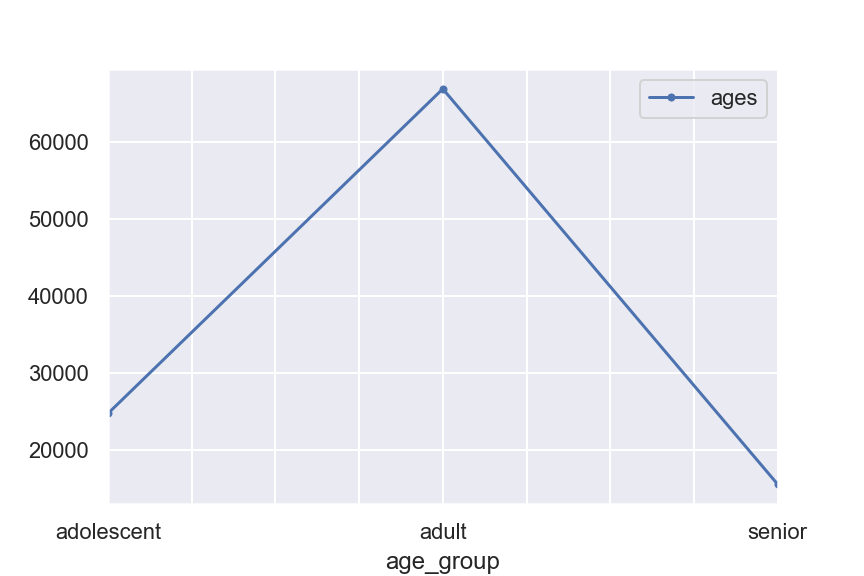

In [40]:
plot_dict = {
    "ages" : [len(fb_adolescent), len(fb_adult), len(fb_senior)],
    "age_group" : ["adolescent", "adult", "senior"]
}

df_ages = pd.DataFrame(plot_dict)
print("Lifestage User Disribution")
df_ages.plot(x ='age_group', y='ages', kind = 'line', marker=".")

Age Disribution


<IPython.core.display.Javascript object>


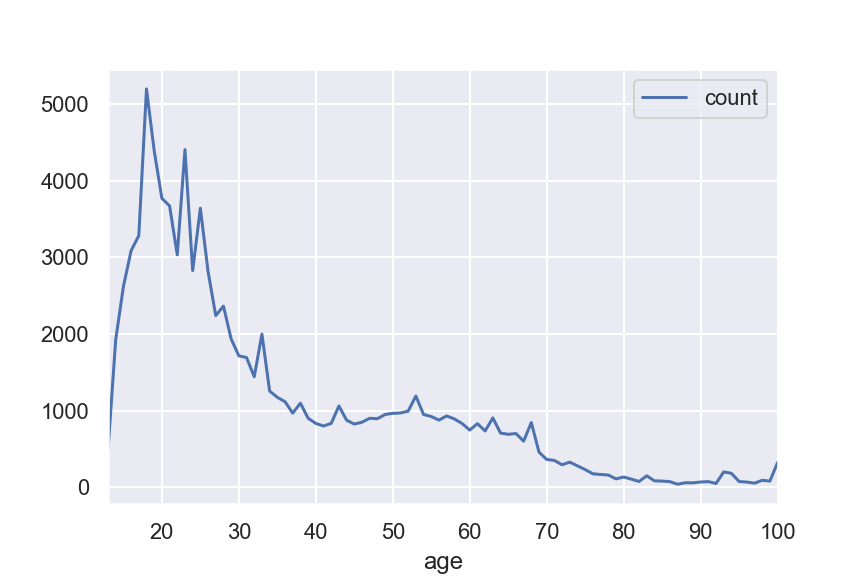

In [41]:
age = []
aged_users = []

def plot_age_distribution():
    for i in range(13, 101):
        age.append(i)
        aged_users.append(len(age_df(df_fb, i)))

plot_age_distribution()

df_age_dist = pd.DataFrame({
    "age" : age,
    "count" : aged_users
})

print("Age Disribution")
df_age_dist.plot(x ='age', y='count', kind = 'line')
plt.show()

(3769, 15)


<IPython.core.display.Javascript object>


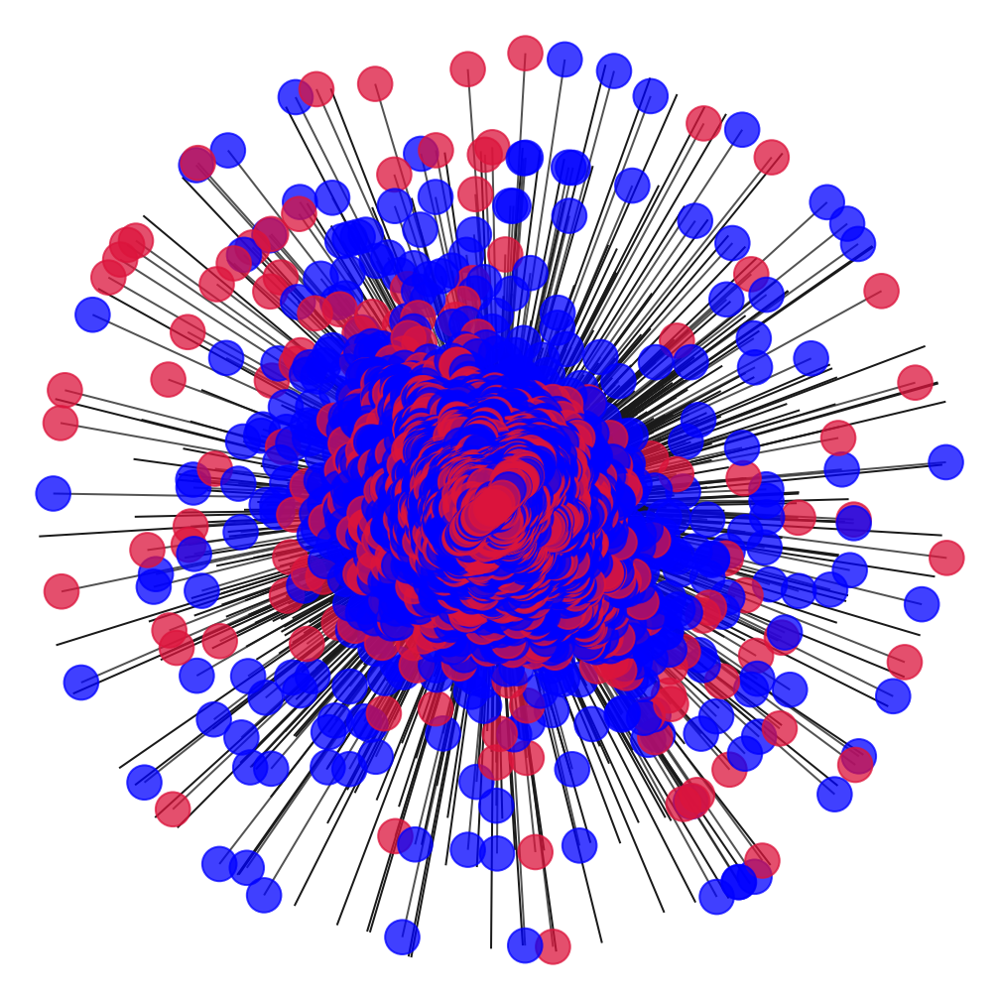

/Users/sarthakdandotiya/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):
/Users/sarthakdandotiya/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


<IPython.core.display.Javascript object>


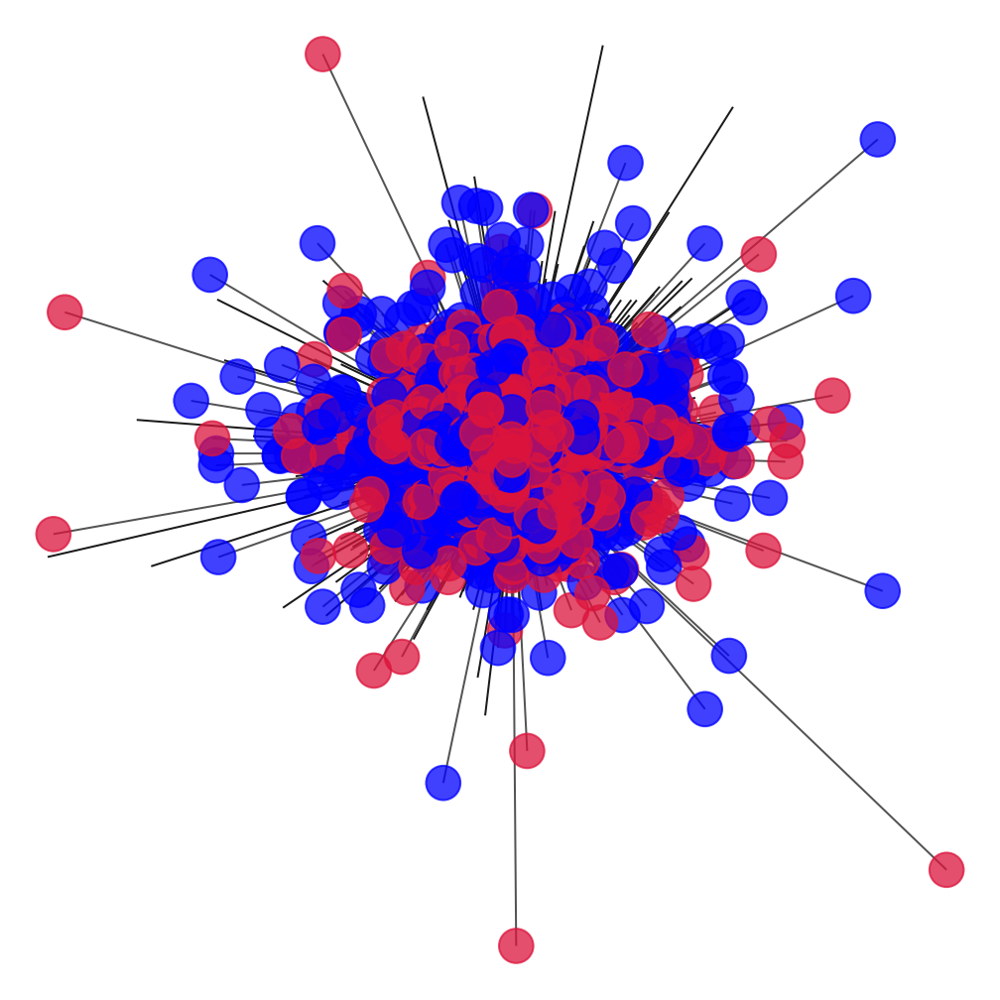

/Users/sarthakdandotiya/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):
/Users/sarthakdandotiya/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


<IPython.core.display.Javascript object>


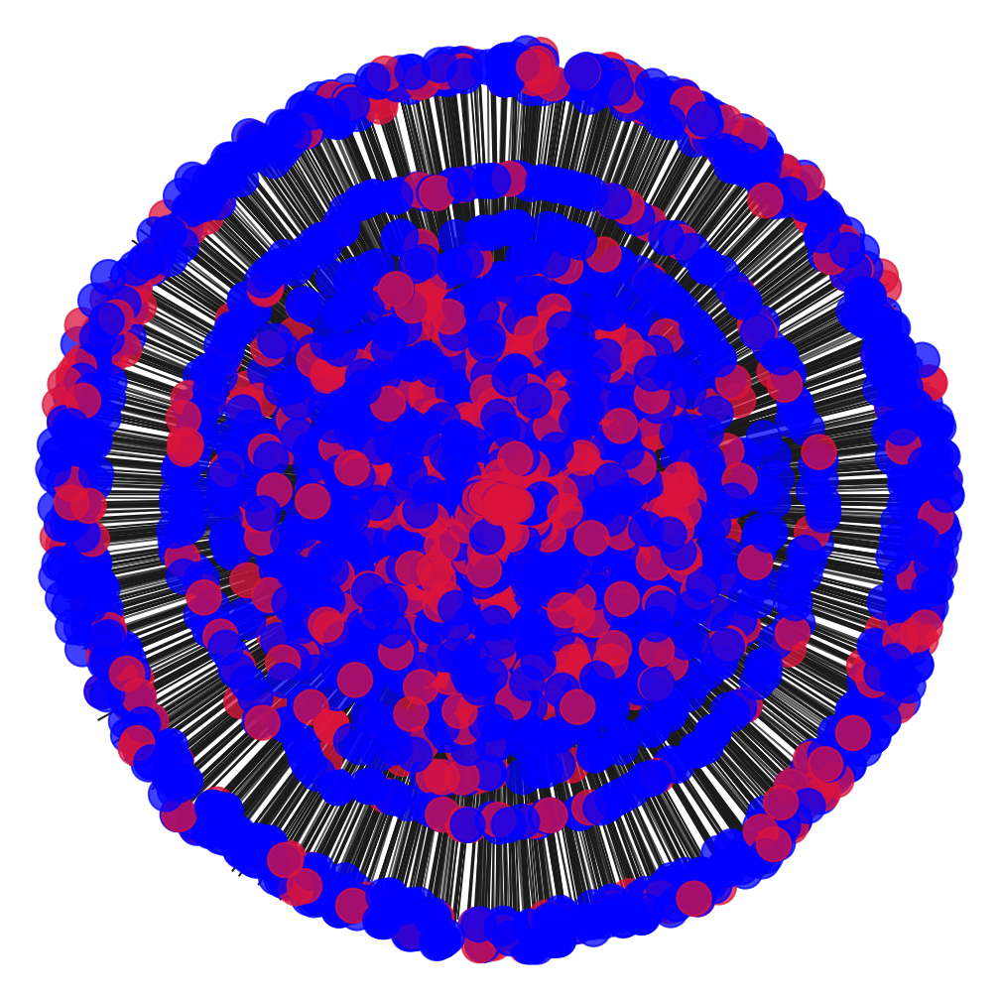

CPU times: user 5min 9s, sys: 718 ms, total: 5min 10s
Wall time: 5min 11s


/Users/sarthakdandotiya/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):
/Users/sarthakdandotiya/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


In [16]:
%%time
import networkx as nx
import seaborn as sns
%matplotlib notebook
sns.set()

def friends_plot(df):
    fname = "Friends"
    G = nx.Graph()
    G.add_node(0)
    color_map = ["orange"]
    
    for i, r in df.iterrows():
        if(df["gender"][i] == "male"):
            color_map.append("blue")
        else:
            color_map.append("crimson")
        G.add_node(i+1)
        G.add_edge(0, i+1, weight = 1+df["friend_count"][i])
        if(i == 4000):
            break
    
    plt.figure(fname, figsize=(7,7))
    pos = nx.spring_layout(G)
    wt = nx.get_edge_attributes(G, "weight")
    nx.draw(G, node_color = color_map, alpha=0.75)
    nx.draw_networkx_edges(G, pos, edge_labels = wt)
    plt.show()
    
def tenure_plot(df):
    fname = "Tenure"
    G = nx.Graph()
    G.add_node(0)
    color_map = ["orange"]
    
    for i, r in df.iterrows():
        if(df["gender"][i] == "male"):
            color_map.append("blue")
        else:
            color_map.append("crimson")
        G.add_node(i+1)
        G.add_edge(0, i+1, weight = 1+df["tenure"][i])
        if(i == 4000):
            break
    
    plt.figure(fname, figsize=(7,7))
    pos = nx.spring_layout(G)
    wt = nx.get_edge_attributes(G, "weight")
    nx.draw(G, node_color = color_map, alpha=0.75)
    nx.draw_networkx_edges(G, pos, edge_labels = wt)
    plt.show()
    
def likes_recv_plot(df):
    fname = "Likes Received"
    G = nx.Graph()
    G.add_node(0)
    color_map = ["orange"]
    
    for i, r in df.iterrows():
        if(df["gender"][i] == "male"):
            color_map.append("blue")
        else:
            color_map.append("crimson")
        G.add_node(i+1)
        G.add_edge(0, i+1, weight = 1+df["likes_received"][i])
        if(i == 4000):
            break
    
    plt.figure(fname, figsize=(7,7))
    pos = nx.spring_layout(G)
    wt = nx.get_edge_attributes(G, "weight")
    nx.draw(G, node_color = color_map, alpha=0.75)
    nx.draw_networkx_edges(G, pos, edge_labels = wt)
    plt.show()

df_20 = age_df(df_fb, 20) # Change the number to get specific age's plot
print(df_20.shape)
friends_plot(df_20)
tenure_plot(df_20)
likes_recv_plot(df_20)

(835, 15)


<IPython.core.display.Javascript object>


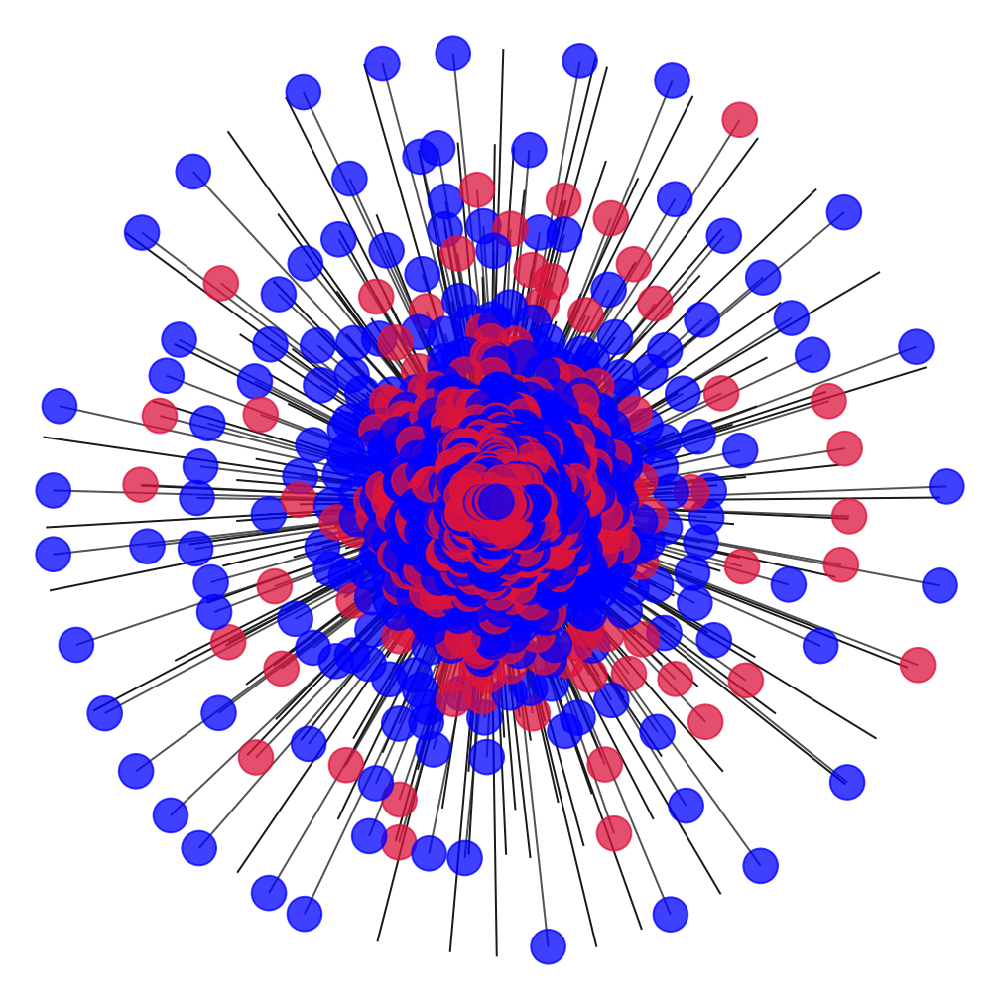

/Users/sarthakdandotiya/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):
/Users/sarthakdandotiya/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


<IPython.core.display.Javascript object>


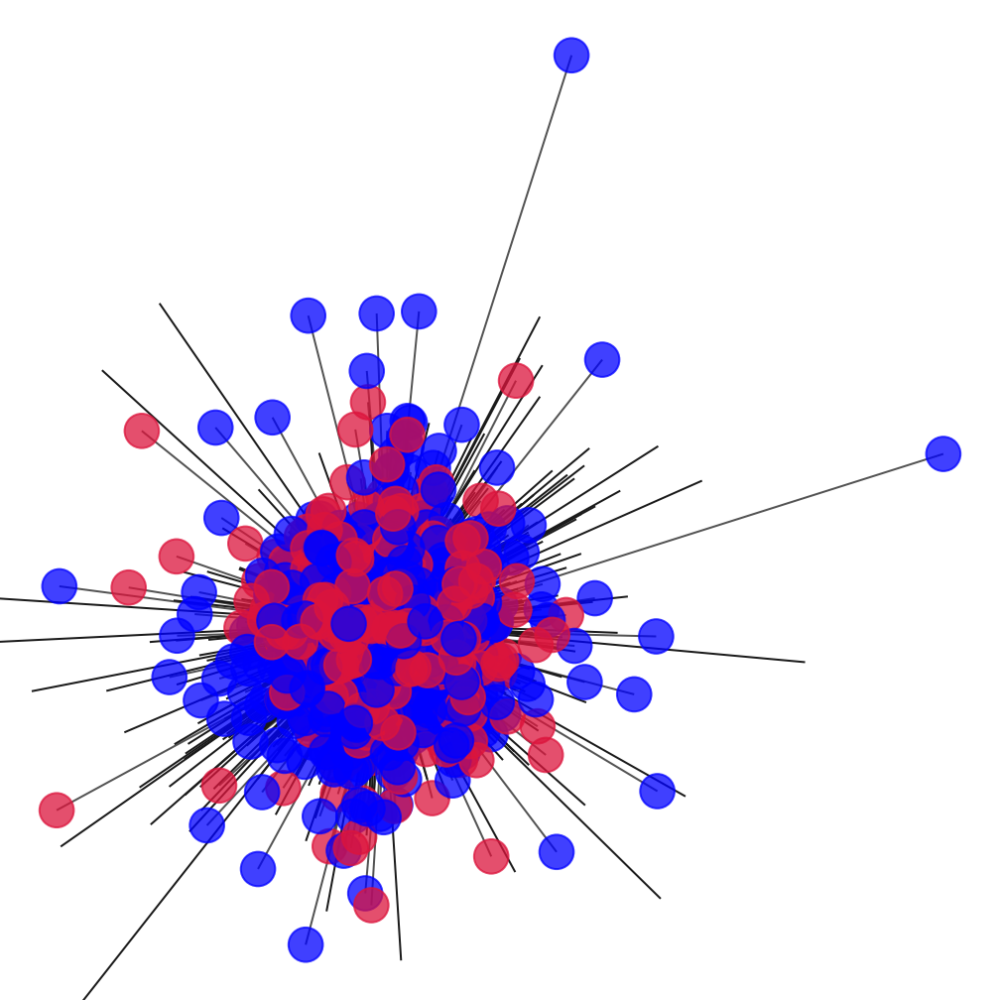

/Users/sarthakdandotiya/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):
/Users/sarthakdandotiya/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


<IPython.core.display.Javascript object>


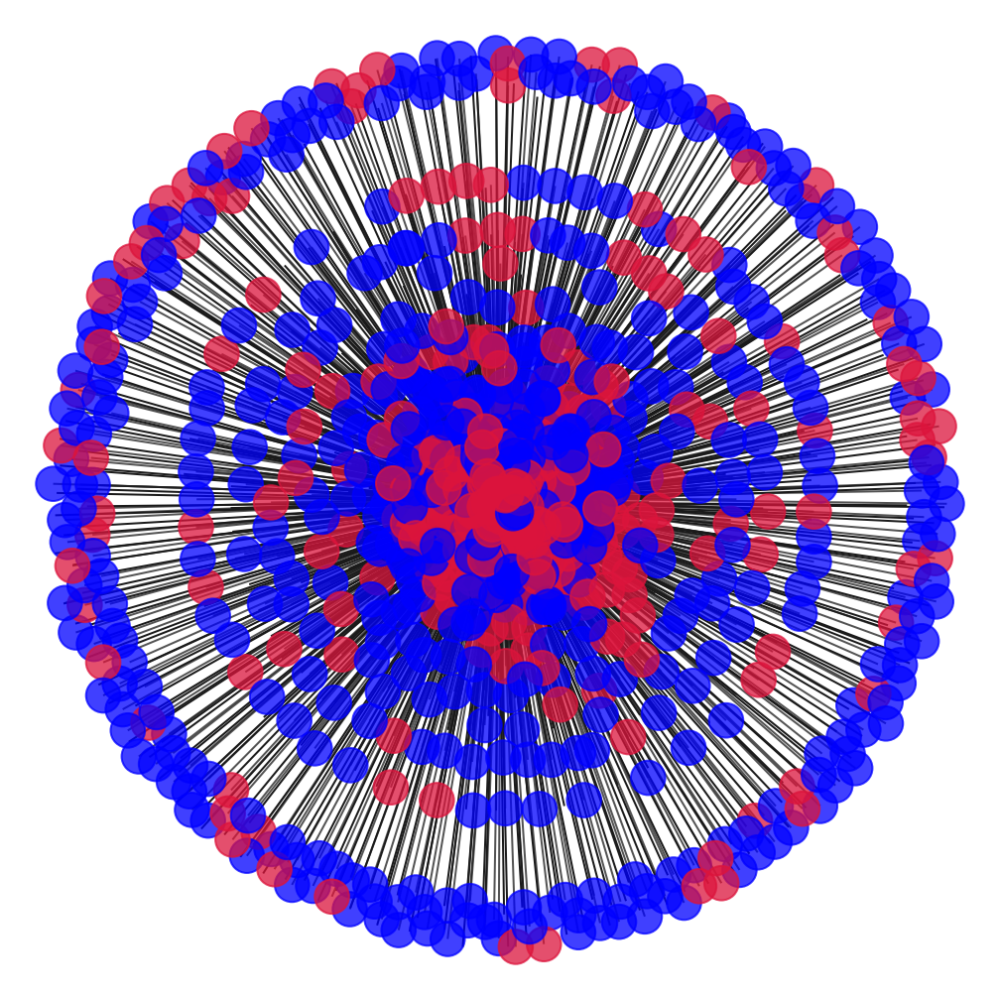

CPU times: user 29.6 s, sys: 163 ms, total: 29.8 s
Wall time: 31.1 s


/Users/sarthakdandotiya/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):
/Users/sarthakdandotiya/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


In [13]:
%%time
import networkx as nx
import seaborn as sns
%matplotlib notebook
sns.set()

def friends_plotx(df):
    fname = "Friends"
    G = nx.Graph()
    G.add_node(0)
    color_map = ["cyan"]
    
    for i, r in df.iterrows():
        if(df["gender"][i] == "male"):
            color_map.append("blue")
        else:
            color_map.append("crimson")
        G.add_node(i+1)
        G.add_edge(0, i+1, weight = 1+df["friend_count"][i])
        if(i == 4000):
            break
    
    plt.figure(fname, figsize=(7,7))
    pos = nx.spring_layout(G)
    wt = nx.get_edge_attributes(G, "weight")
    nx.draw(G, node_color = color_map, alpha=0.75)
    nx.draw_networkx_edges(G, pos, edge_labels = wt)
    plt.show()
    
def tenure_plotx(df):
    fname = "Tenure"
    G = nx.Graph()
    G.add_node(0)
    color_map = ["orange"]
    
    for i, r in df.iterrows():
        if(df["gender"][i] == "male"):
            color_map.append("blue")
        else:
            color_map.append("crimson")
        G.add_node(i+1)
        G.add_edge(0, i+1, weight = 1+df["tenure"][i])
        if(i == 4000):
            break
    
    plt.figure(fname, figsize=(7,7))
    pos = nx.spring_layout(G)
    wt = nx.get_edge_attributes(G, "weight")
    nx.draw(G, node_color = color_map, alpha=0.75)
    nx.draw_networkx_edges(G, pos, edge_labels = wt)
    plt.show()
    
def likes_recv_plotx(df):
    fname = "Likes Received"
    G = nx.Graph()
    G.add_node(0)
    color_map = ["orange"]
    
    for i, r in df.iterrows():
        if(df["gender"][i] == "male"):
            color_map.append("blue")
        else:
            color_map.append("crimson")
        G.add_node(i+1)
        G.add_edge(0, i+1, weight = 1+df["likes_received"][i])
        if(i == 4000):
            break
    
    plt.figure(fname, figsize=(7,7))
    pos = nx.spring_layout(G)
    wt = nx.get_edge_attributes(G, "weight")
    nx.draw(G, node_color = color_map, alpha=0.75)
    nx.draw_networkx_edges(G, pos, edge_labels = wt)
    plt.show()

df_40 = age_df(df_fb, 40)
print(df_40.shape)
friends_plotx(df_40)
tenure_plotx(df_40)
likes_recv_plotx(df_40)

(693, 15)


<IPython.core.display.Javascript object>


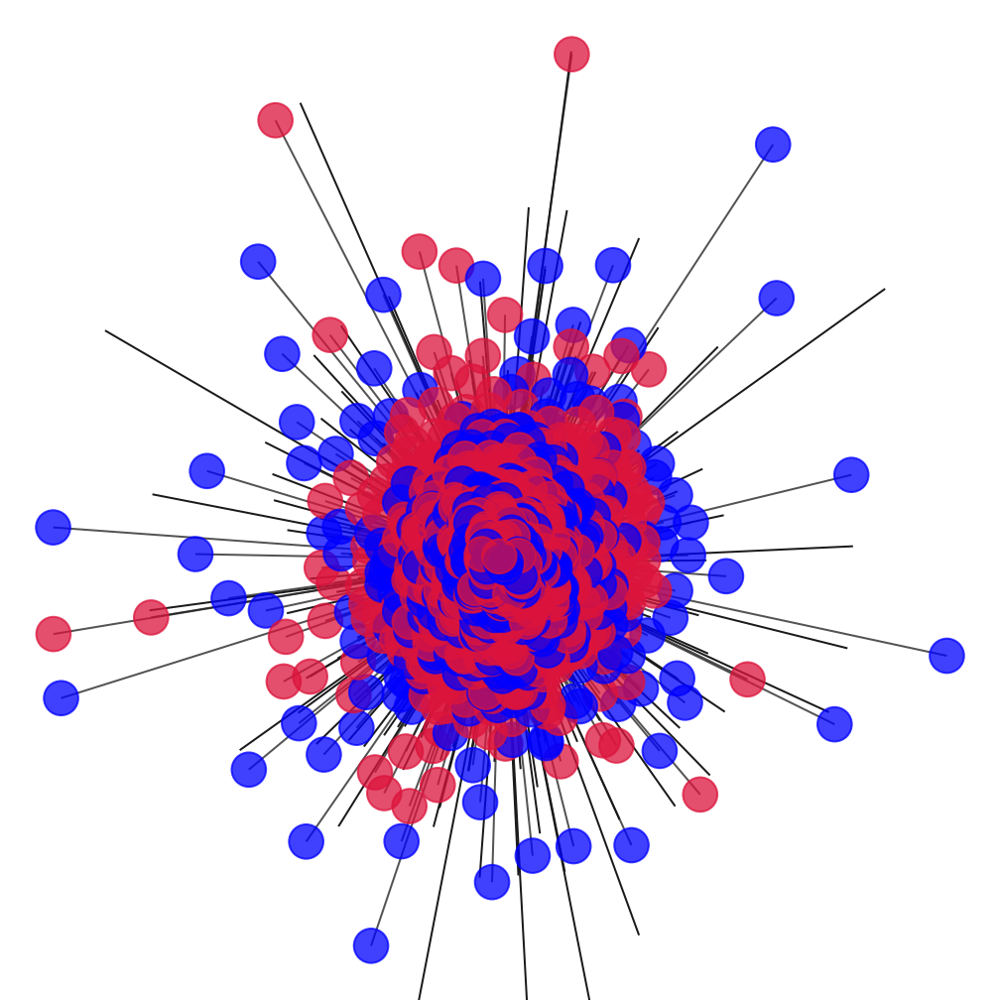

/Users/sarthakdandotiya/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):
/Users/sarthakdandotiya/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


<IPython.core.display.Javascript object>


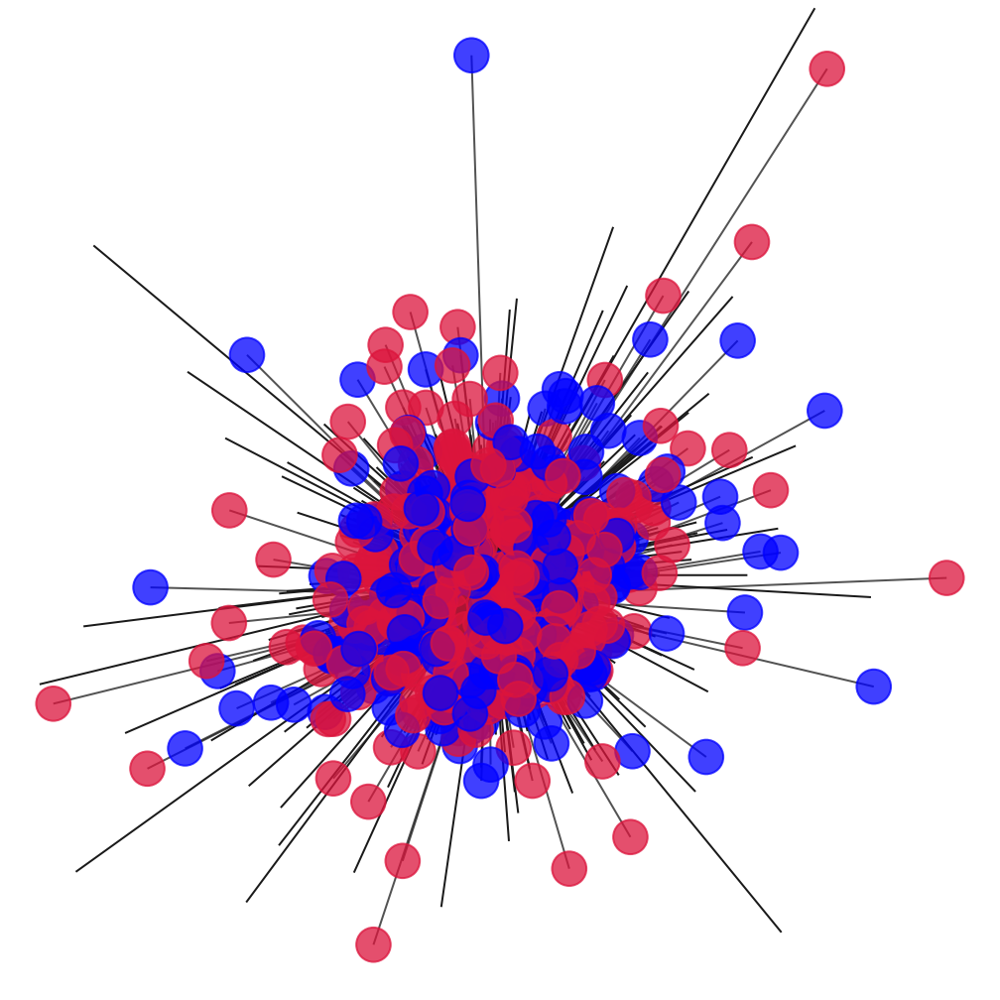

/Users/sarthakdandotiya/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):
/Users/sarthakdandotiya/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


<IPython.core.display.Javascript object>


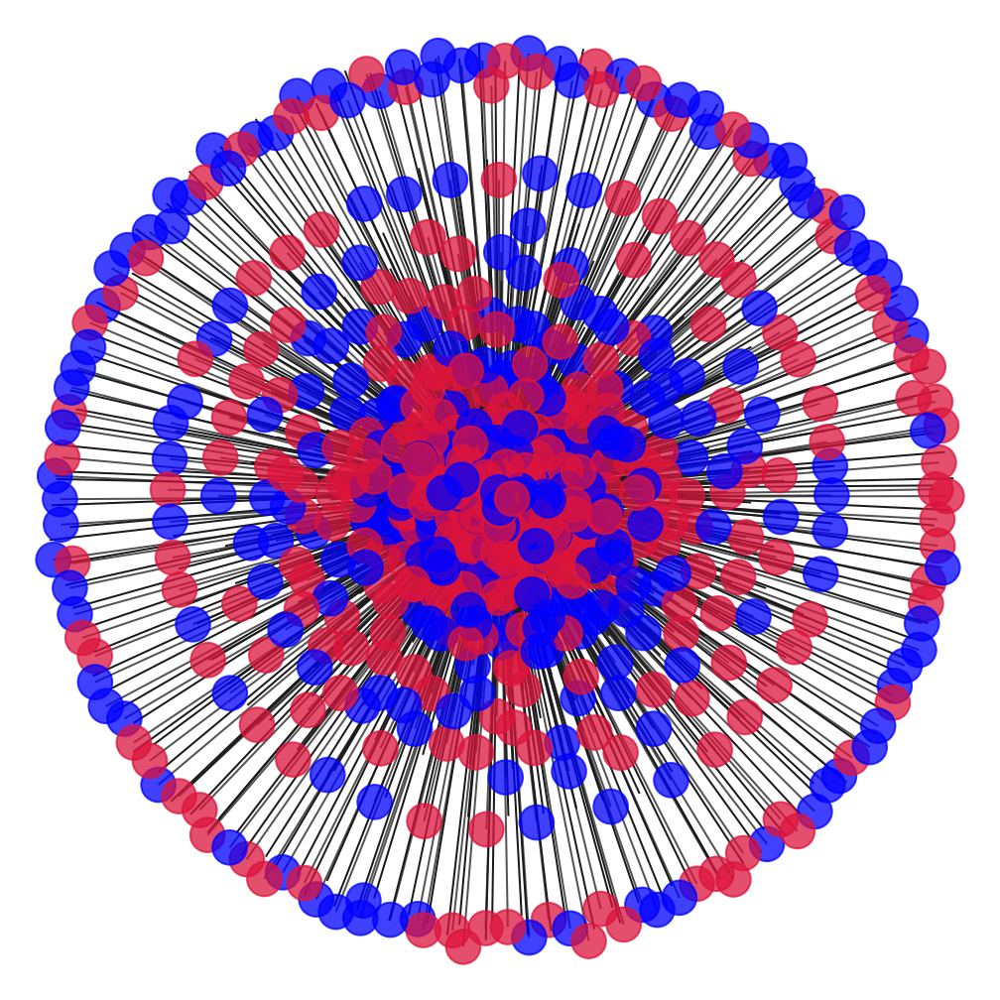

CPU times: user 24.6 s, sys: 198 ms, total: 24.8 s
Wall time: 26 s


/Users/sarthakdandotiya/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):
/Users/sarthakdandotiya/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


In [14]:
%%time
import networkx as nx
import seaborn as sns
%matplotlib notebook
sns.set()

def friends_plotxx(df):
    fname = "Friends"
    G = nx.Graph()
    G.add_node(0)
    color_map = ["cyan"]
    
    for i, r in df.iterrows():
        if(df["gender"][i] == "male"):
            color_map.append("blue")
        else:
            color_map.append("crimson")
        G.add_node(i+1)
        G.add_edge(0, i+1, weight = 1+df["friend_count"][i])
        if(i == 4000):
            break
    
    plt.figure(fname, figsize=(7,7))
    pos = nx.spring_layout(G)
    wt = nx.get_edge_attributes(G, "weight")
    nx.draw(G, node_color = color_map, alpha=0.75)
    nx.draw_networkx_edges(G, pos, edge_labels = wt)
    plt.show()
    
def tenure_plotxx(df):
    fname = "Tenure"
    G = nx.Graph()
    G.add_node(0)
    color_map = ["orange"]
    
    for i, r in df.iterrows():
        if(df["gender"][i] == "male"):
            color_map.append("blue")
        else:
            color_map.append("crimson")
        G.add_node(i+1)
        G.add_edge(0, i+1, weight = 1+df["tenure"][i])
        if(i == 4000):
            break
    
    plt.figure(fname, figsize=(7,7))
    pos = nx.spring_layout(G)
    wt = nx.get_edge_attributes(G, "weight")
    nx.draw(G, node_color = color_map, alpha=0.75)
    nx.draw_networkx_edges(G, pos, edge_labels = wt)
    plt.show()
    
def likes_recv_plotxx(df):
    fname = "Likes Received"
    G = nx.Graph()
    G.add_node(0)
    color_map = ["orange"]
    
    for i, r in df.iterrows():
        if(df["gender"][i] == "male"):
            color_map.append("blue")
        else:
            color_map.append("crimson")
        G.add_node(i+1)
        G.add_edge(0, i+1, weight = 1+df["likes_received"][i])
        if(i == 4000):
            break
    
    plt.figure(fname, figsize=(7,7))
    pos = nx.spring_layout(G)
    wt = nx.get_edge_attributes(G, "weight")
    nx.draw(G, node_color = color_map, alpha=0.75)
    nx.draw_networkx_edges(G, pos, edge_labels = wt)
    plt.show()

df_65 = age_df(df_fb, 65)
print(df_65.shape)
friends_plotxx(df_65)
tenure_plotxx(df_65)
likes_recv_plotxx(df_65)